# review 데이터 wordcloud로 시각화하기
1. 불용어(필요없는 단어) 제외
2. wordcloud 시각화

In [18]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from wordcloud import WordCloud

# 횟수를 기반으로 딕셔너리 생성
from collections import Counter

In [19]:
review = pd.read_csv("../data/preprocessed_data/total_review_token.csv", encoding="utf-8")

In [20]:
review.info()
review.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24852 entries, 0 to 24851
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   performance_id  24852 non-null  object
 1   review_num      24852 non-null  int64 
 2   rating          24852 non-null  int64 
 3   user_id         24852 non-null  object
 4   date            24852 non-null  object
 5   view_count      24852 non-null  int64 
 6   like_count      24852 non-null  int64 
 7   title           24852 non-null  object
 8   content         24852 non-null  object
 9   title_n         24852 non-null  object
 10  content_n       24852 non-null  object
dtypes: int64(4), object(7)
memory usage: 2.1+ MB


,performance_id,review_num,rating,user_id,date,view_count,like_count,title,content,title_n,content_n
0,23008837,0,5,tmdfl0***,2024.02.05,6,0,추천합니다,최고의극,['추천'],['최고']
1,23008837,1,5,youi1***,2024.01.02,22,0,레베카 공연 최고,배우들의 연기와 감정 최고였음 앙코르 기념공연 기대되요,"['레베카', '공연', '최고']","['배우', '연기', '감정', '최고', '앙코르', '기념', '공연']"
2,23008837,2,5,wani***,2023.12.18,13,0,역시 레베카다,최애 공연입니다 볼때마다 레전드 갱신,"['역시', '레베카']","['최애', '공연', '볼때', '레전드', '갱신']"
3,23008837,3,5,tsk***,2023.12.16,48,0,옥주연님의 덴버스 부인을 보고,년 전 신영숙님의 덴버스 부인을 보고 강한 충격을 먹고 옥주연님의 연기도 너무 ...,"['주연', '버스', '부인', '보고']","['버스', '부인', '보고', '충격', '주연', '연기', '기대', '커서..."
4,23008837,4,5,kys95***,2023.12.13,20,0,믿고 보는 옥댄버,물개박수 치면서 관람 했어요 정말 인생 뮤지컬이었던 옥댄버 성량이 블루스퀘...,['옥댄버'],"['물개', '박수', '치면', '관람', '정말', '인생', '뮤지컬', '옥..."


In [21]:
# 리스트형으로 변환

import ast

review["title_n"] = review["title_n"].apply(ast.literal_eval)
review["content_n"] = review["content_n"].apply(ast.literal_eval)

In [22]:
# title + content
review["total_n"] = review.apply(lambda row: row['title_n'] + row['content_n'], axis=1)

- 뮤지컬별 후기 token 모기 -> 불용어 제거 -> count 하기
    - 공연 제목 (공연별로 제거 -> info.csv를 불러와 매칭해 제거)
        - "브론테", "레베카", "웨스턴", "스토리", "라면", "오즈", (늘근도둑, 죽여주는)"이야기", "사이"
    - "공연", "배우"
    - 연극 -> "연극", 뮤지컬 -> "뮤지컬"

In [23]:
delete_words = {
    "24001487" : ["뮤지컬", "브론테", "공연", "배우"],
    "24001224" : ["뮤지컬", "오즈", "공연", "배우"],
    "23001653#" : ["뮤지컬", "영웅", "공연", "배우"],
    "24002031" : ["뮤지컬", "웨스턴", "스토리", "공연", "배우"],
    "23008837" : ["뮤지컬", "레베카", "공연", "배우"],
    "19018229#" : ["연극", "공연", "배우"],
    "23008491" : ["연극", "이야기", "공연", "배우"],
    "22001159" : ["연극", "이야기", "공연", "배우"],
    "24000171" : ["연극", "라면", "공연", "배우"],
    "22014277#" : ["연극", "사이", "공연", "배우"]
}

In [24]:
delete_words

{'24001487': ['뮤지컬', '브론테', '공연', '배우'],
 '24001224': ['뮤지컬', '오즈', '공연', '배우'],
 '23001653#': ['뮤지컬', '영웅', '공연', '배우'],
 '24002031': ['뮤지컬', '웨스턴', '스토리', '공연', '배우'],
 '23008837': ['뮤지컬', '레베카', '공연', '배우'],
 '19018229#': ['연극', '공연', '배우'],
 '23008491': ['연극', '이야기', '공연', '배우'],
 '22001159': ['연극', '이야기', '공연', '배우'],
 '24000171': ['연극', '라면', '공연', '배우'],
 '22014277#': ['연극', '사이', '공연', '배우']}

In [25]:
# 공연별 토큰 합치기 
tokens = dict()

for id in review["performance_id"].unique():
    df = review[review["performance_id"] == id]

    token = []
    for row in df["total_n"].values:
        # print(id, row)
        token.extend(row)
        
    tokens[id] = token

In [26]:
# 공연별 불용어 제거
for id in review["performance_id"].unique():
    result_token = []
    for token in tokens[id]:
        if token not in delete_words[id]:
            result_token.append(token)
    
    tokens[id] = result_token

In [27]:
# 공연별 단어 count
counter = dict()

for id in review["performance_id"].unique():
    counter[id] = Counter(tokens[id])

In [28]:
review.head()

,performance_id,review_num,rating,user_id,date,view_count,like_count,title,content,title_n,content_n,total_n
0,23008837,0,5,tmdfl0***,2024.02.05,6,0,추천합니다,최고의극,[추천],[최고],"[추천, 최고]"
1,23008837,1,5,youi1***,2024.01.02,22,0,레베카 공연 최고,배우들의 연기와 감정 최고였음 앙코르 기념공연 기대되요,"[레베카, 공연, 최고]","[배우, 연기, 감정, 최고, 앙코르, 기념, 공연]","[레베카, 공연, 최고, 배우, 연기, 감정, 최고, 앙코르, 기념, 공연]"
2,23008837,2,5,wani***,2023.12.18,13,0,역시 레베카다,최애 공연입니다 볼때마다 레전드 갱신,"[역시, 레베카]","[최애, 공연, 볼때, 레전드, 갱신]","[역시, 레베카, 최애, 공연, 볼때, 레전드, 갱신]"
3,23008837,3,5,tsk***,2023.12.16,48,0,옥주연님의 덴버스 부인을 보고,년 전 신영숙님의 덴버스 부인을 보고 강한 충격을 먹고 옥주연님의 연기도 너무 ...,"[주연, 버스, 부인, 보고]","[버스, 부인, 보고, 충격, 주연, 연기, 기대, 커서, 걱정, 정말, 뮤지컬, ...","[주연, 버스, 부인, 보고, 버스, 부인, 보고, 충격, 주연, 연기, 기대, 커..."
4,23008837,4,5,kys95***,2023.12.13,20,0,믿고 보는 옥댄버,물개박수 치면서 관람 했어요 정말 인생 뮤지컬이었던 옥댄버 성량이 블루스퀘...,[옥댄버],"[물개, 박수, 치면, 관람, 정말, 인생, 뮤지컬, 옥댄버, 성량, 블루, 스퀘어]","[옥댄버, 물개, 박수, 치면, 관람, 정말, 인생, 뮤지컬, 옥댄버, 성량, 블루..."


---

In [29]:
# mask 만드는 함수

import PIL
import numpy as np
import matplotlib.pyplot as plt

def make_wordcloud_mask(path):
    icon = PIL.Image.open(path)
    mask = icon.convert("RGBA")  # RGBA 채널로 변환하여 투명한 마스크 생성

    # 투명한 부분을 모두 흰색으로 채우는 마스크 생성
    mask_data = np.array(mask)
    mask_data[:, :, 3] = 255  # 모든 픽셀의 알파 채널 값을 255로 설정 (투명하지 않음)
    mask = PIL.Image.fromarray(mask_data)

    img = PIL.Image.new('RGB', icon.size, (255, 255, 255))
    img.paste(icon, (0, 0), mask)
    img = np.array(img)
    
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    return img

- mask 후보

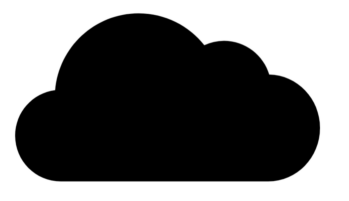

In [30]:
path = 'mask/cloud.png'
cloud = make_wordcloud_mask(path)

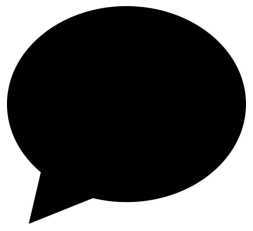

In [31]:
path = 'mask/bubble.png'
bubble = make_wordcloud_mask(path)

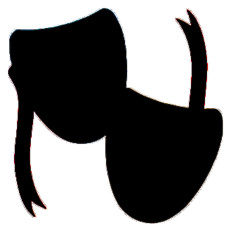

In [32]:
path = 'mask/performance.png'
performance = make_wordcloud_mask(path)

In [33]:
# 워드클라우드 출력 + 저장 함수

def make_wordcloud(data, mask, colormap, id):
    wc = WordCloud(font_path='C:/Windows/Fonts/malgunbd.ttf',  #폰트
                    background_color='white',                              #배경색
                    width=800, height=600 ,                                #사이즈설정
                    max_words=200,
                    mask = mask,
                    colormap = colormap)                                         #단어갯수

    cloud = wc.generate_from_frequencies(data)                            #사전형태 데이터

    plt.figure(figsize=(50,50))                                           #액자사이즈설정
    plt.axis('off')                                                       #테두리 선 없애기
    plt.imshow(cloud, interpolation="bilinear")
    plt.savefig(f"wordcloud/wordcloud_{id}.png", bbox_inches='tight') # dpi=300, 
    plt.show()

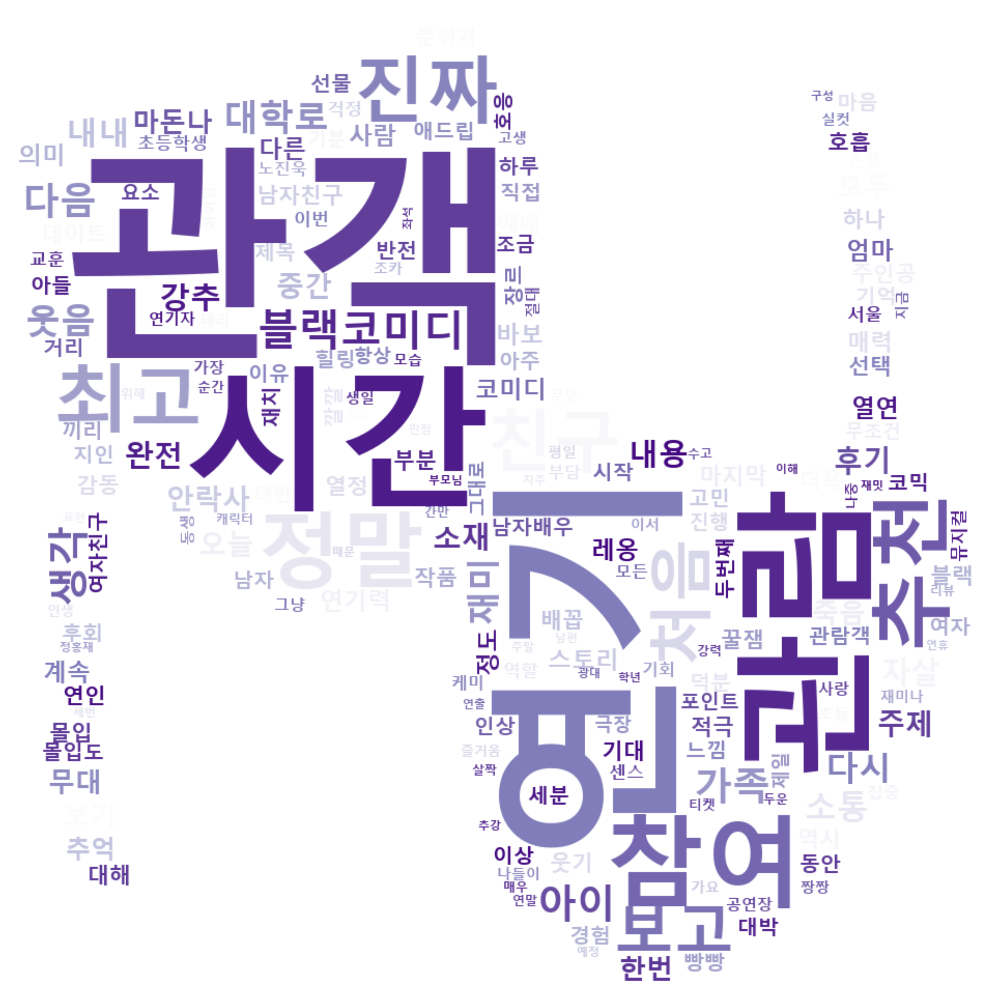

In [57]:
# 하나만 돌리기
colormap = "Purples"

id = "23008491"
data = counter[id]
make_wordcloud(data, performance, colormap, id)

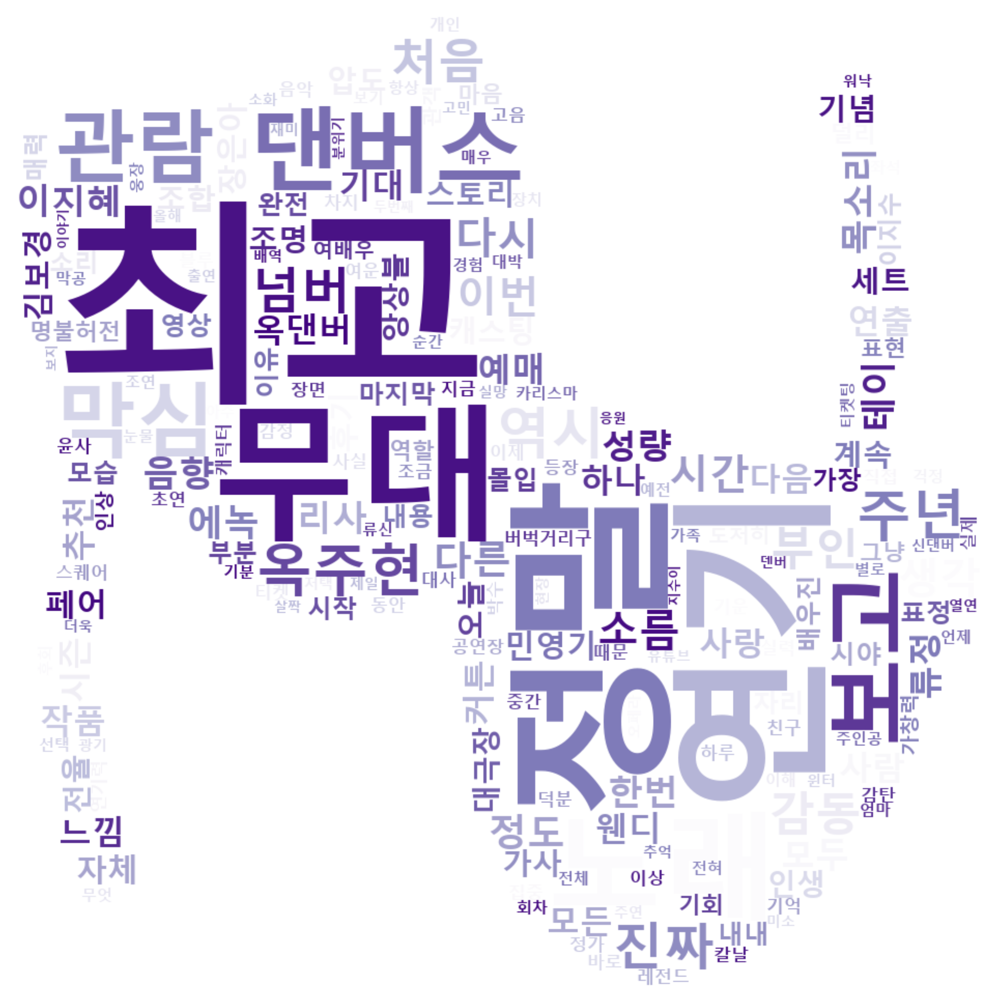

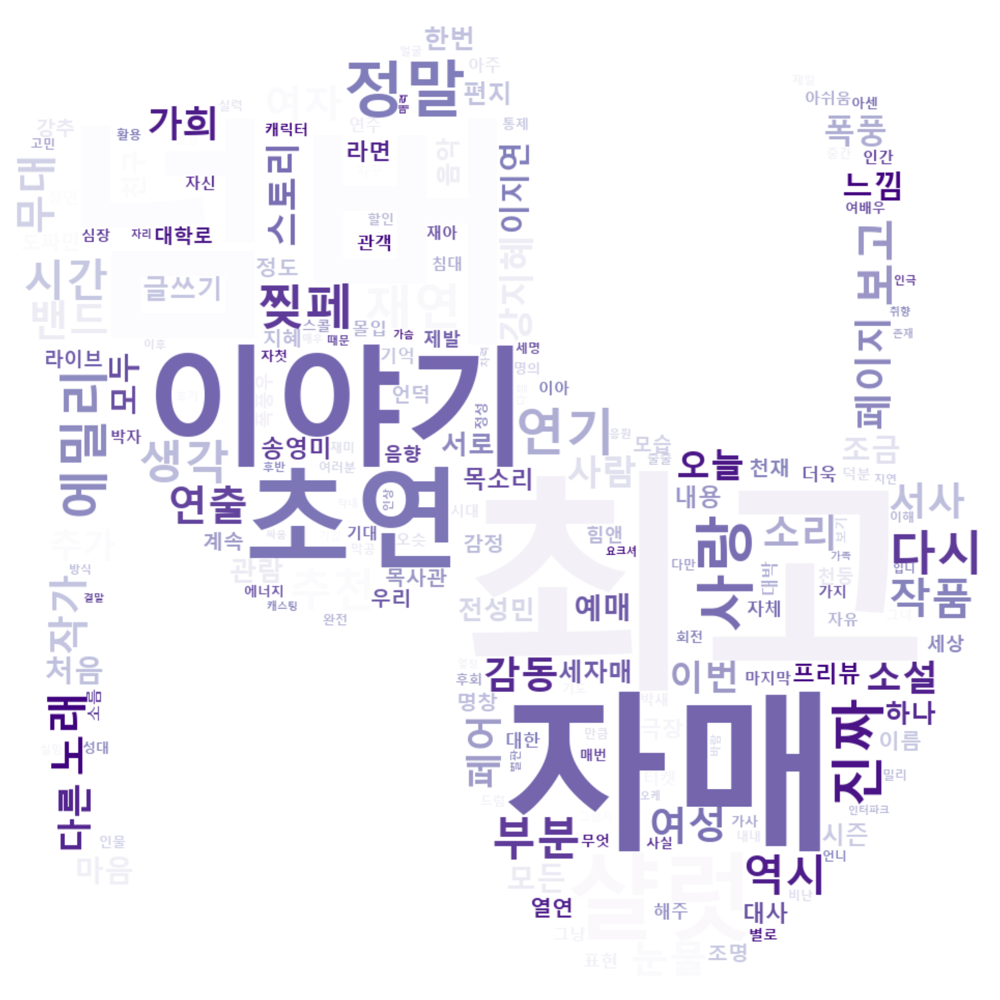

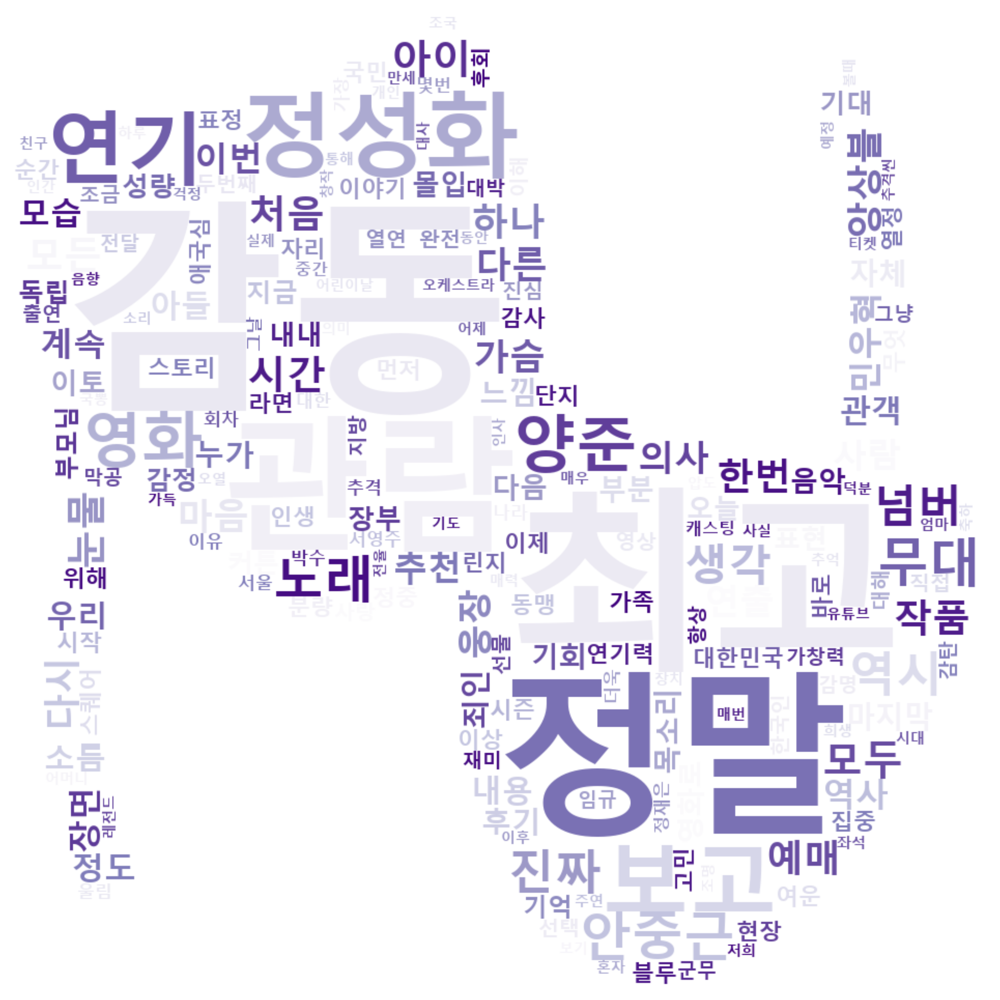

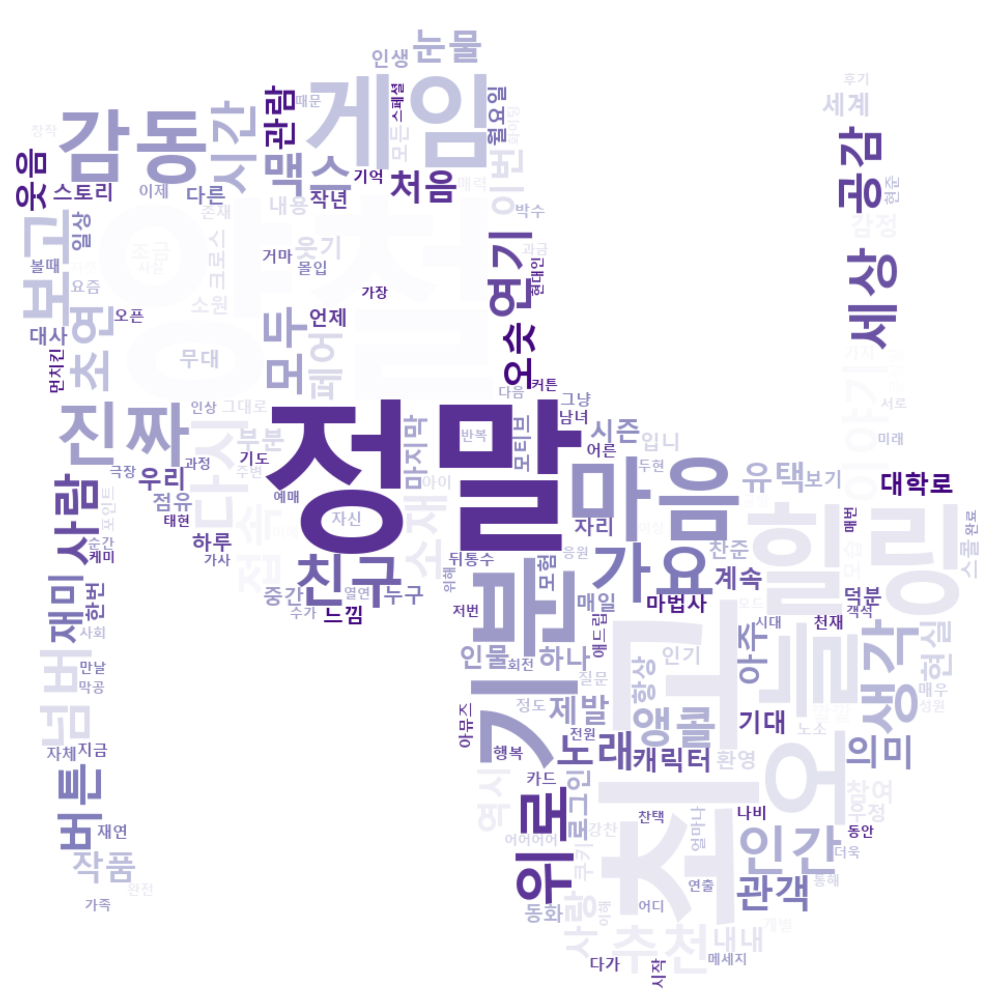

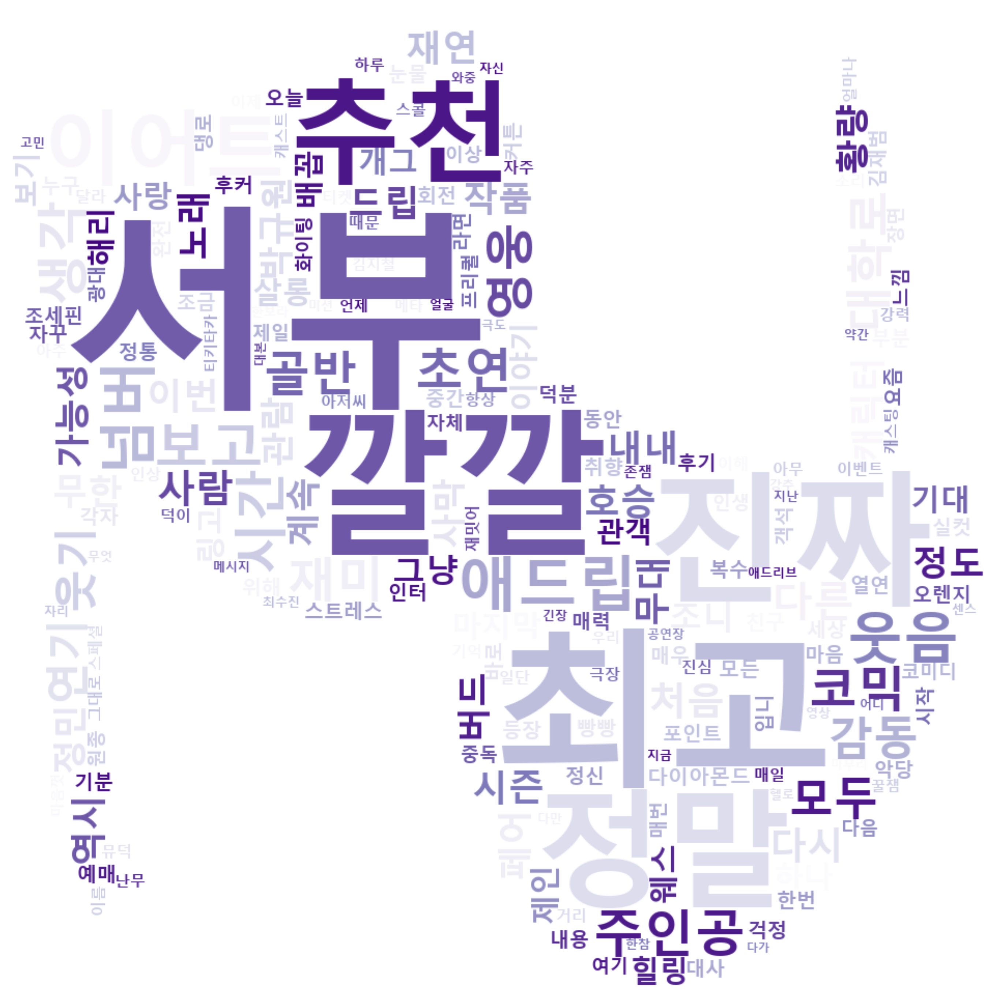

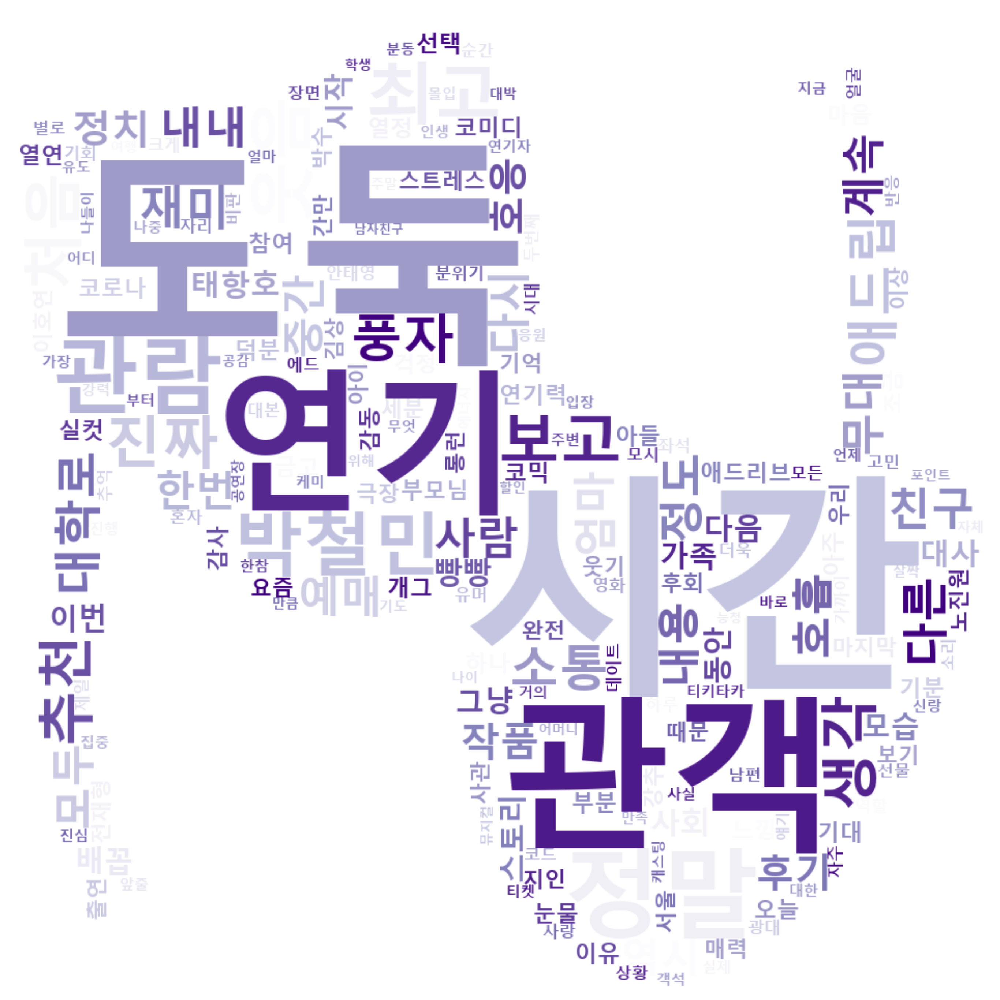

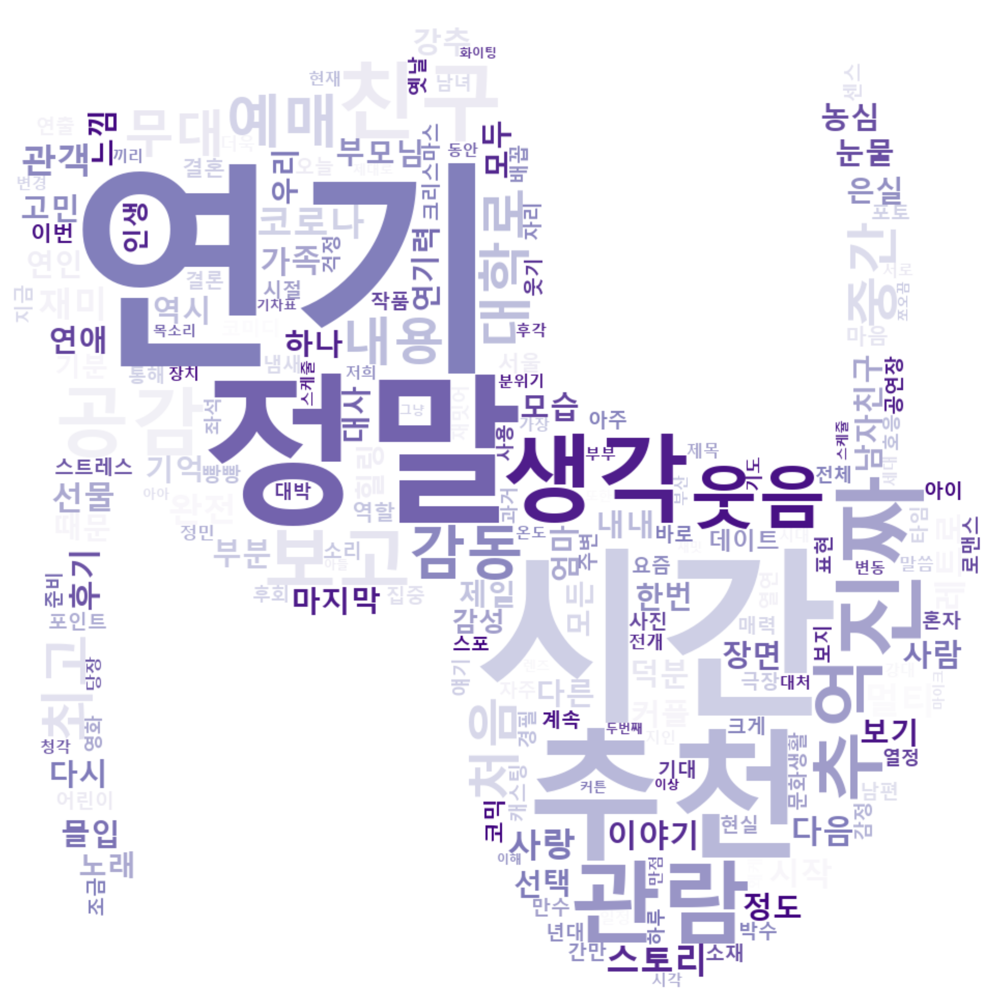

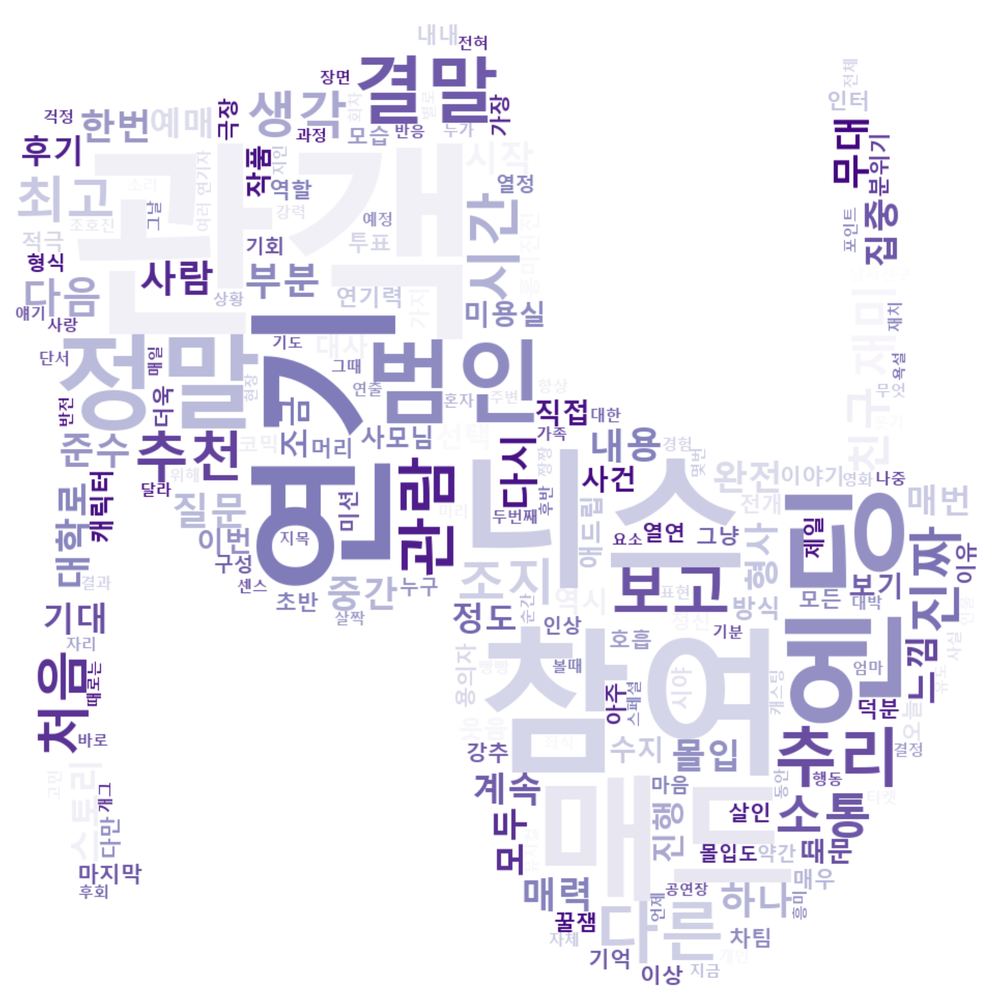

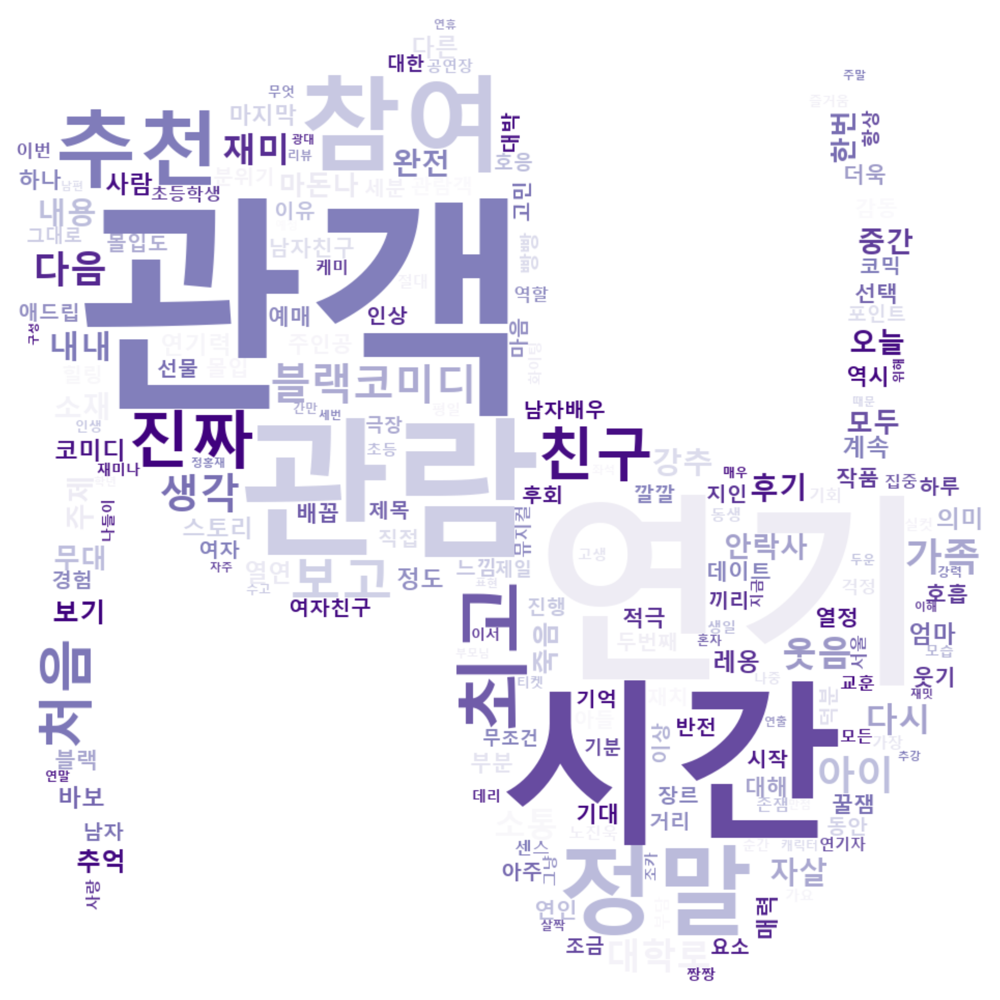

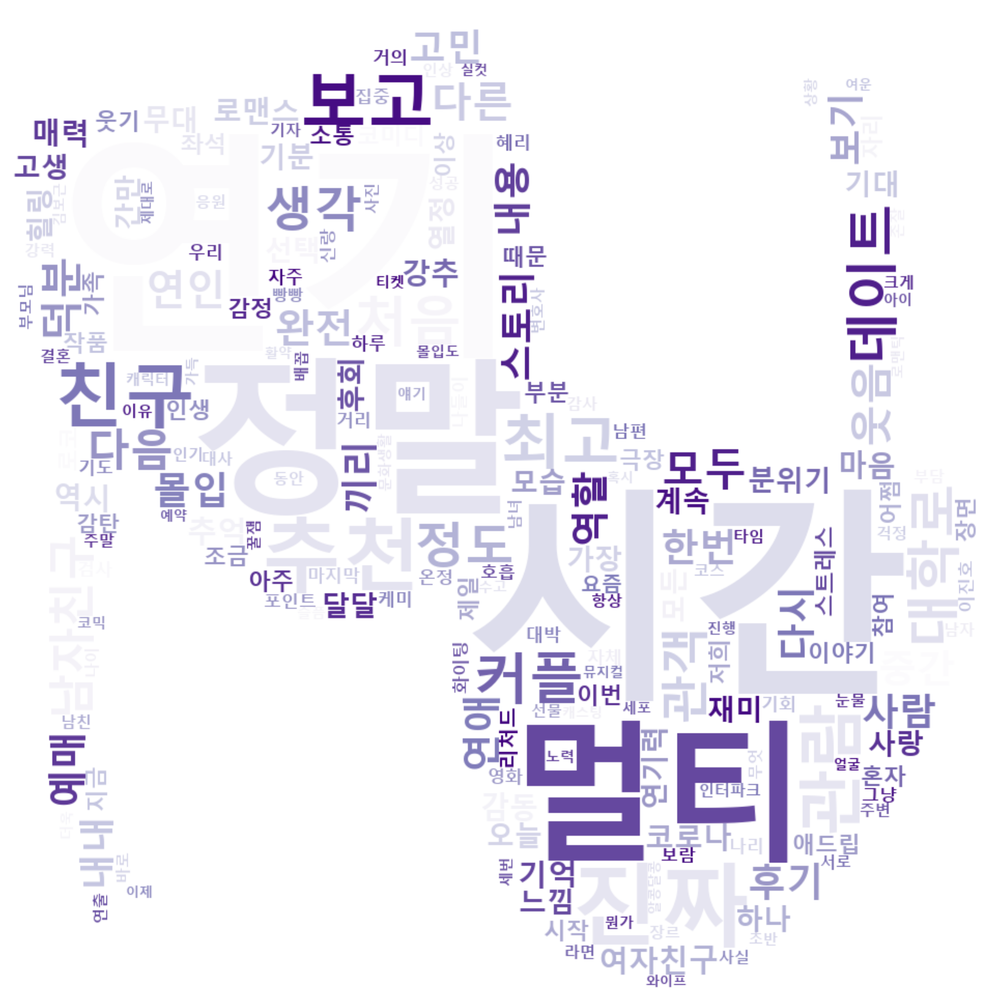

In [34]:
# 여러 개 한 번에 돌리기
colormap = "Purples"

for id in review["performance_id"].unique():
    data = counter[id]
    make_wordcloud(data, performance, colormap, id)